In [2]:
tennis_data <- read.csv("atp2017-2019.csv")
tennis_data

X,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,⋯,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
<int>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,<int>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,2019-M020,Brisbane,Hard,32,A,20181231,300,105453,2,⋯,54,34,20,14,10,15,9,3590,16,1977
1,2019-M020,Brisbane,Hard,32,A,20181231,299,106421,4,⋯,52,36,7,10,10,13,16,1977,239,200
2,2019-M020,Brisbane,Hard,32,A,20181231,298,105453,2,⋯,27,15,6,8,1,5,9,3590,40,1050
3,2019-M020,Brisbane,Hard,32,A,20181231,297,104542,,⋯,60,38,9,11,4,6,239,200,31,1298
4,2019-M020,Brisbane,Hard,32,A,20181231,296,106421,4,⋯,56,46,19,15,2,4,16,1977,18,1855
5,2019-M020,Brisbane,Hard,32,A,20181231,295,104871,,⋯,54,40,18,15,6,9,40,1050,185,275
6,2019-M020,Brisbane,Hard,32,A,20181231,294,105453,2,⋯,53,37,13,12,6,9,9,3590,19,1835
7,2019-M020,Brisbane,Hard,32,A,20181231,293,104542,,⋯,51,34,11,11,6,11,239,200,77,691
8,2019-M020,Brisbane,Hard,32,A,20181231,292,200282,7,⋯,39,30,3,9,3,6,31,1298,72,715


In [3]:
library(tidyverse)
library(dplyr)
library(repr)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


In [4]:
tennis_select <- select(tennis_data, winner_name, loser_name, w_ace, l_ace, w_bpSaved, l_bpSaved, w_bpFaced, l_bpFaced) 
tennis_select

winner_name,loser_name,w_ace,l_ace,w_bpSaved,l_bpSaved,w_bpFaced,l_bpFaced
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Kei Nishikori,Daniil Medvedev,3,8,3,10,6,15
Daniil Medvedev,Jo Wilfried Tsonga,10,17,0,10,1,13
Kei Nishikori,Jeremy Chardy,2,10,2,1,2,5
Jo Wilfried Tsonga,Alex De Minaur,12,1,4,4,5,6
Daniil Medvedev,Milos Raonic,12,29,8,2,8,4
Jeremy Chardy,Yasutaka Uchiyama,10,12,4,6,8,9
Kei Nishikori,Grigor Dimitrov,5,8,0,6,1,9
Jo Wilfried Tsonga,Taro Daniel,11,3,4,6,7,11
Alex De Minaur,Jordan Thompson,1,5,0,3,0,6


In [5]:
 #tennis_mod<- pivot_longer(tennis_select,
 #       cols = winner_name:loser_name,
  #      names_to = "result",
   #     values_to = "player_name")
    #mutate(w_bp_per = w_bpSaved/w_bpFaced) |>
    #mutate(l_bp_per = l_bpSaved/l_bpFaced)

In [15]:
tennis_select_w <- select(tennis_data, winner_name, w_ace, w_bpSaved,  w_bpFaced) |>
    mutate(SavedoverFaced = w_bpSaved/w_bpFaced)|>
    rename(name=winner_name, ace=w_ace, bpSaved=w_bpSaved, bpFaced=w_bpFaced) |>
    mutate(result = 1)
#players who faced zero bp will be excluded from the data
tennis_select_w

name,ace,bpSaved,bpFaced,SavedoverFaced,result
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Kei Nishikori,3,3,6,0.5000000,1
Daniil Medvedev,10,0,1,0.0000000,1
Kei Nishikori,2,2,2,1.0000000,1
Jo Wilfried Tsonga,12,4,5,0.8000000,1
Daniil Medvedev,12,8,8,1.0000000,1
Jeremy Chardy,10,4,8,0.5000000,1
Kei Nishikori,5,0,1,0.0000000,1
Jo Wilfried Tsonga,11,4,7,0.5714286,1
Alex De Minaur,1,0,0,NaN,1


In [16]:
tennis_select_l <- select(tennis_data,loser_name, l_ace,  l_bpSaved, l_bpFaced) |>
    mutate(SavedoverFaced = l_bpSaved/l_bpFaced)|>
    rename(name=loser_name, ace=l_ace, bpSaved=l_bpSaved, bpFaced=l_bpFaced) |>
    mutate(result = 0)
tennis_select_l

name,ace,bpSaved,bpFaced,SavedoverFaced,result
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Daniil Medvedev,8,10,15,0.6666667,0
Jo Wilfried Tsonga,17,10,13,0.7692308,0
Jeremy Chardy,10,1,5,0.2000000,0
Alex De Minaur,1,4,6,0.6666667,0
Milos Raonic,29,2,4,0.5000000,0
Yasutaka Uchiyama,12,6,9,0.6666667,0
Grigor Dimitrov,8,6,9,0.6666667,0
Taro Daniel,3,6,11,0.5454545,0
Jordan Thompson,5,3,6,0.5000000,0


In [18]:
combined_data <- rbind(tennis_select_w, tennis_select_l)
combined_data

name,ace,bpSaved,bpFaced,SavedoverFaced,result
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Kei Nishikori,3,3,6,0.5000000,1
Daniil Medvedev,10,0,1,0.0000000,1
Kei Nishikori,2,2,2,1.0000000,1
Jo Wilfried Tsonga,12,4,5,0.8000000,1
Daniil Medvedev,12,8,8,1.0000000,1
Jeremy Chardy,10,4,8,0.5000000,1
Kei Nishikori,5,0,1,0.0000000,1
Jo Wilfried Tsonga,11,4,7,0.5714286,1
Alex De Minaur,1,0,0,NaN,1


Warning message:
“Removed 784 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 112 rows containing missing values (`geom_point()`).”


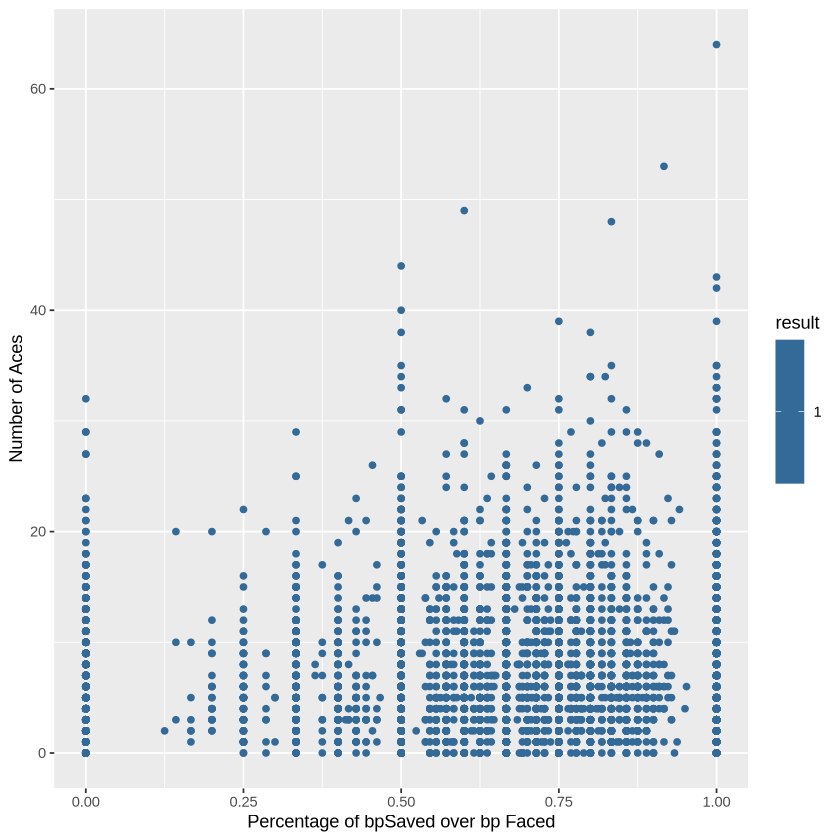

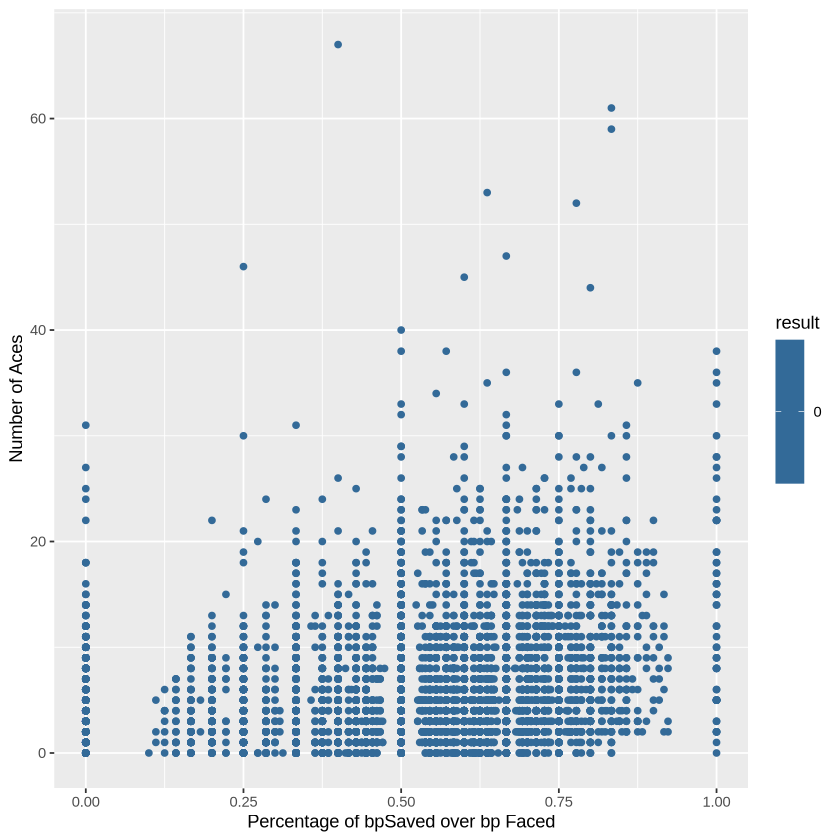

In [25]:
tennis_l_plot <- tennis_select_l |>
ggplot(aes(x=SavedoverFaced, y=ace))+
geom_point(aes(colour = result)) +
labs(x= "Percentage of bpSaved over bp Faced", y="Number of Aces", colour="result")

tennis_w_plot <- tennis_select_w |>
ggplot(aes(x=SavedoverFaced, y=ace))+
geom_point(aes(colour = result)) +
labs(x= "Percentage of bpSaved over bp Faced", y="Number of Aces", colour="result")

tennis_w_plot
tennis_l_plot

Warning message:
“Removed 896 rows containing missing values (`geom_point()`).”


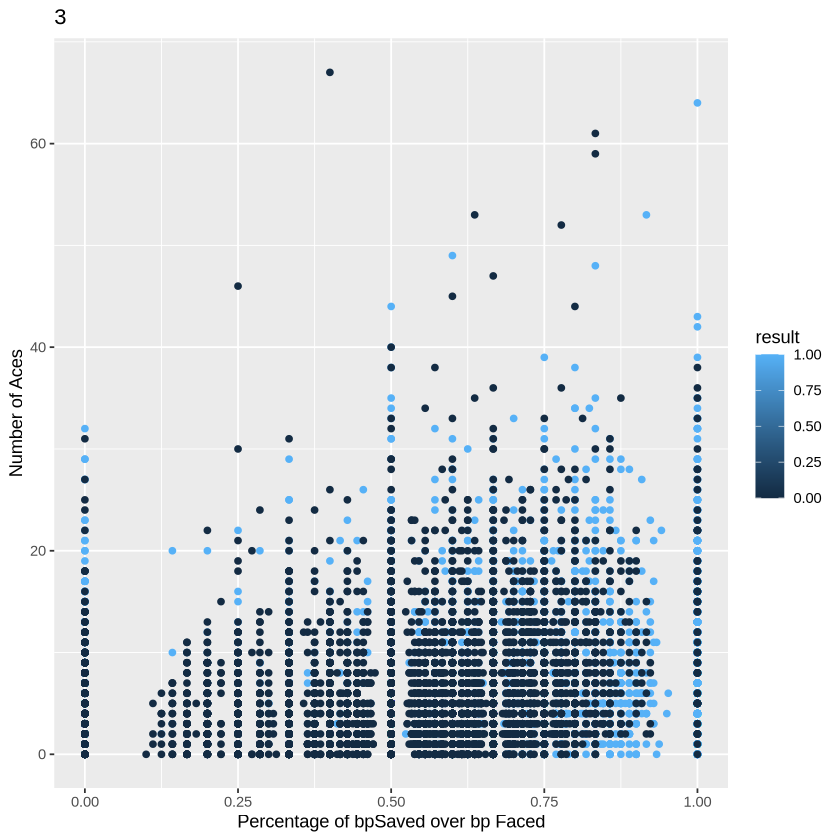

In [24]:
combined_plot <- combined_data |>
ggplot(aes(x=SavedoverFaced, y=ace))+
geom_point(aes(colour = result)) +
labs(x= "Percentage of bpSaved over bp Faced", y="Number of Aces", colour="result")+
ggtitle("3")
combined_plot